## Preprocessing for Big Data

I added a header and changed the data type of the dataset so that it is  easier to perform the Big Data Assignment

In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Import libraries
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
# Define column names
column_names = ['id', 'unix_time', 'date', 
                'flag', 'user', 'text']

In [4]:
# Load the dataset without a header and assign column names
df_projecttweets = pd.read_csv('ProjectTweets.csv', header=None, names=column_names)

In [5]:
# Check that the dataset was uploaded correctly
df_projecttweets.head(5)

,id,unix_time,date,flag,user,text
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,1,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...
2,2,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...
3,3,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire
4,4,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all...."


In [6]:
# Checking the types of data
df_projecttweets.dtypes

id            int64
unix_time     int64
date         object
flag         object
user         object
text         object
dtype: object

In [7]:
# Convert the 'Date' from string to datetime
df_projecttweets['date'] = pd.to_datetime(df_projecttweets['date'])

In [8]:
# Checking the types of data
df_projecttweets.dtypes

id                    int64
unix_time             int64
date         datetime64[ns]
flag                 object
user                 object
text                 object
dtype: object

In [9]:
df_projecttweets.to_csv('tweets.csv', index=False)

## Work done in the VM

#### Hadoop

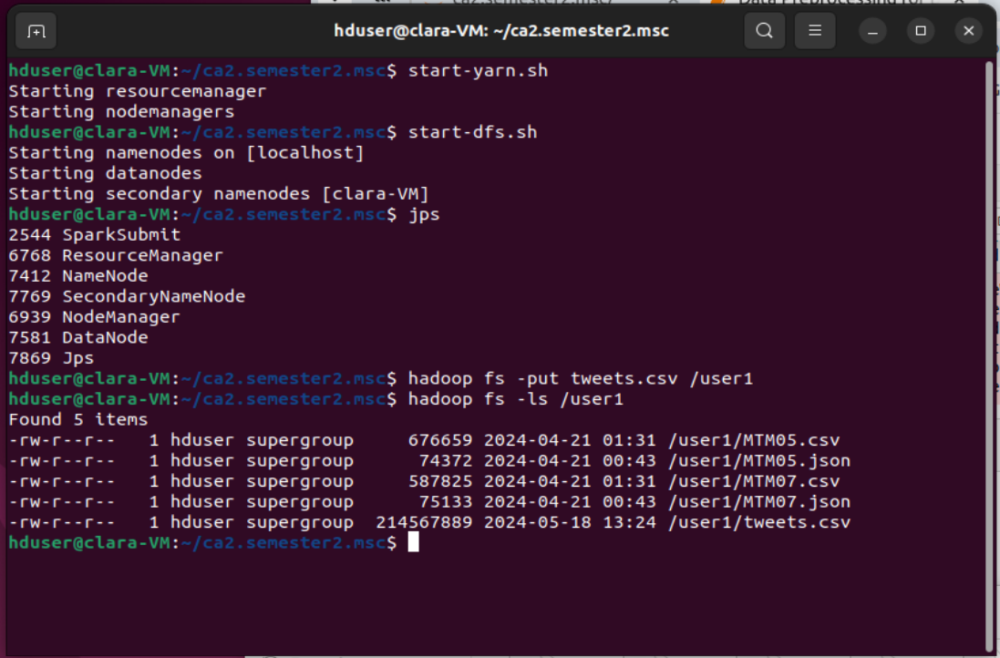

In [5]:
from IPython.display import Image
Image(filename=r'1. Hadoop Storage.png')

Start Hadoop Services: The commands start-yarn.sh and start-dfs.sh start the Hadoop YARN (Yet Another Resource Negotiator) and HDFS (Hadoop Distributed File System) services, respectively.

Check Services: The jps command lists the Java processes, showing that ResourceManager, NameNode, SecondaryNameNode, NodeManager, DataNode, and other Hadoop components are running.

Upload File to HDFS: The command hadoop fs -put tweets.csv /user1 uploads the tweets.csv file to the HDFS directory /user1.

List HDFS Directory: The command hadoop fs -ls /user1 lists the contents of the /user1 directory, showing that the tweets.csv file has been successfully uploaded.

#### MongoDB

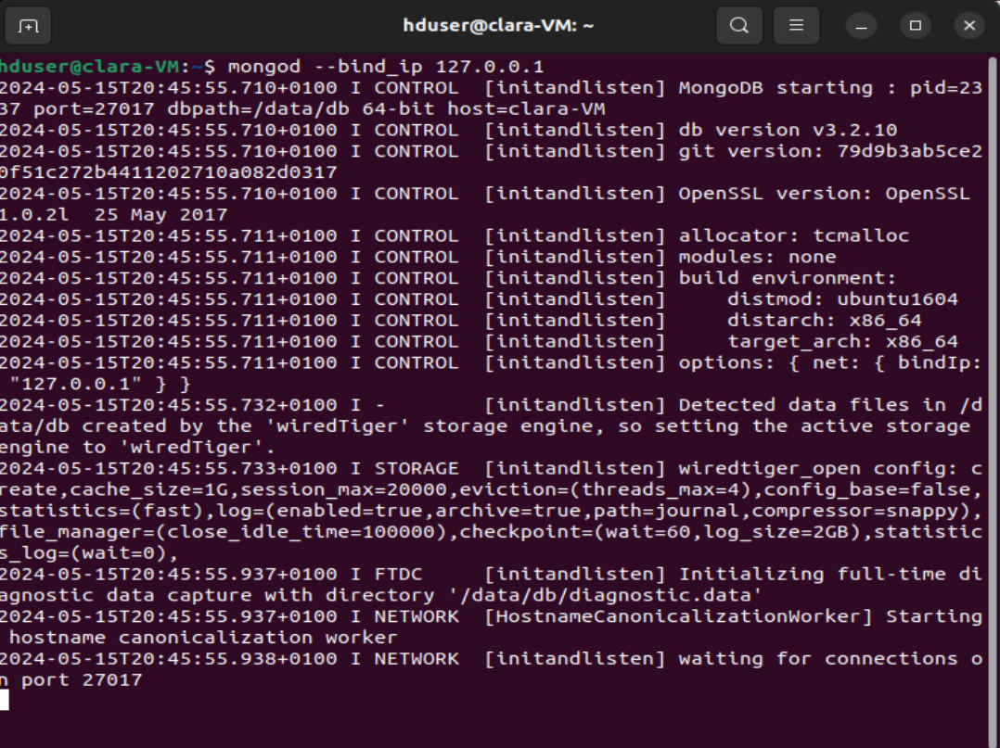

In [6]:
from IPython.display import Image
Image(filename=r'1. Abrir MongoDB.png')

Command to Start MongoDB: The command mongod --bind_ip 127.0.0.1 is used to start the MongoDB server and bind it to the local IP address (127.0.0.1). This means MongoDB will listen for connections only from the localhost.

Server Output: The output indicates that MongoDB has started successfully, detailing the version, storage engine, and network settings. The waiting for connections on port 27017 line indicates that MongoDB is ready to accept connections on its default port (27017).

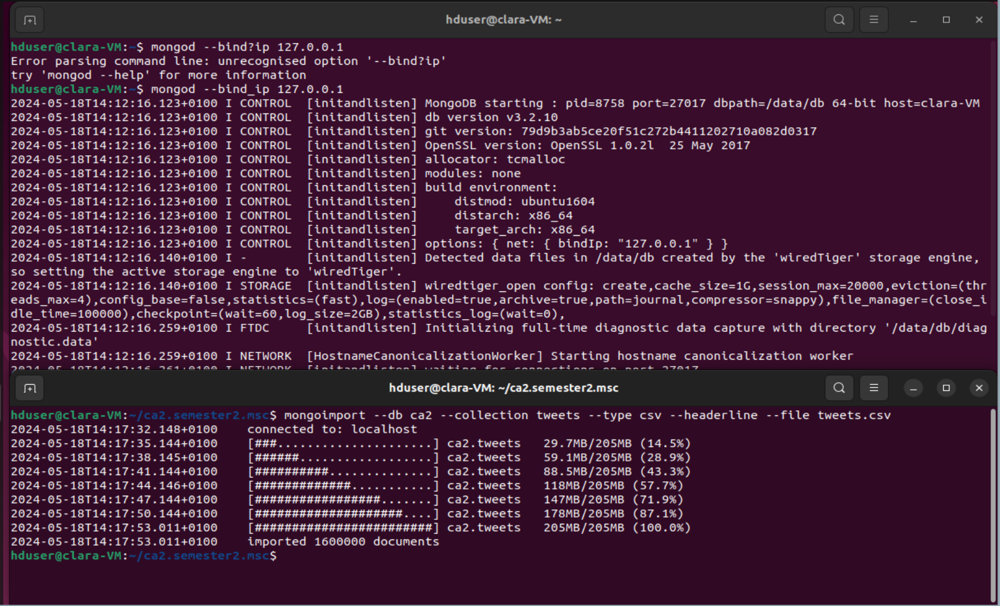

In [7]:
from IPython.display import Image
Image(filename=r'2. MongoDB Storage - Upload the Dataset.png')

Start MongoDB Server: Similar to Image 1, MongoDB is started using mongod --bind_ip 127.0.0.1.

Import Data into MongoDB: The mongoimport command imports data from tweets.csv into the MongoDB database ca2 and collection tweets. The command specifies that the input file is in CSV format and includes headers (--headerline).

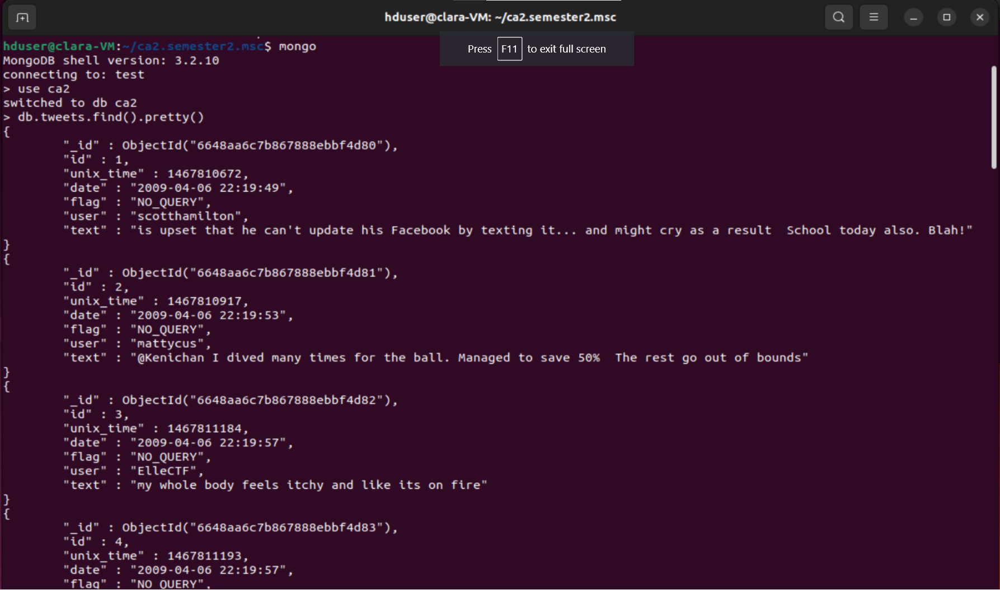

In [20]:
from IPython.display import Image
Image(filename=r'3. MongoDB Storage - check that dataset was uploaded.png')

Open MongoDB Shell: The mongo command opens the MongoDB shell.

Use Database: The command use ca2 switches to the ca2 database.

Query Collection: The command db.tweets.find().pretty() retrieves and displays documents from the tweets collection in a readable format, confirming that the data has been successfully imported.

#### YCSB

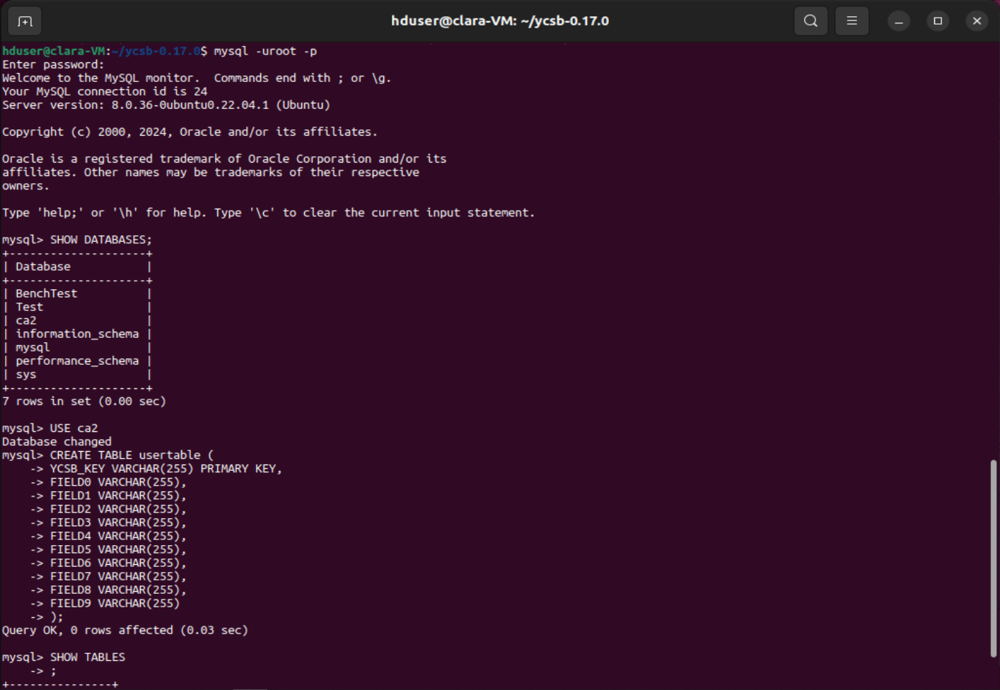

In [14]:
from IPython.display import Image
Image(filename=r'4. YCSB SQL Create Database and Table - Field9.png')

MySQL Shell: The mysql -uroot -p command logs into the MySQL shell as the root user.

Show Databases: The SHOW DATABASES; command lists all databases in MySQL.

Use Database: The command USE ca2 switches to the ca2 database.

Create Table: The CREATE TABLE command creates a new table called usertable with multiple fields.

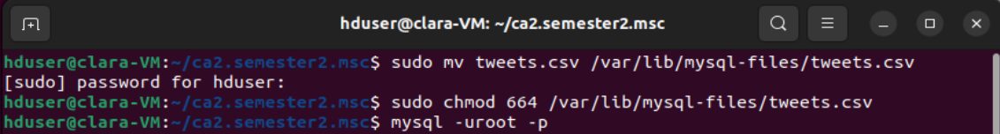

In [15]:
from IPython.display import Image
Image(filename=r'5. YCSB SQL Move csv into mysql files.png')

Move CSV File: The command sudo mv tweets.csv /var/lib/mysql-files/tweets.csv moves the tweets.csv file to the MySQL files directory, which allows MySQL to access it for data import.

Change Permissions: The command sudo chmod 664 /var/lib/mysql-files/tweets.csv changes the file permissions to allow read and write access.

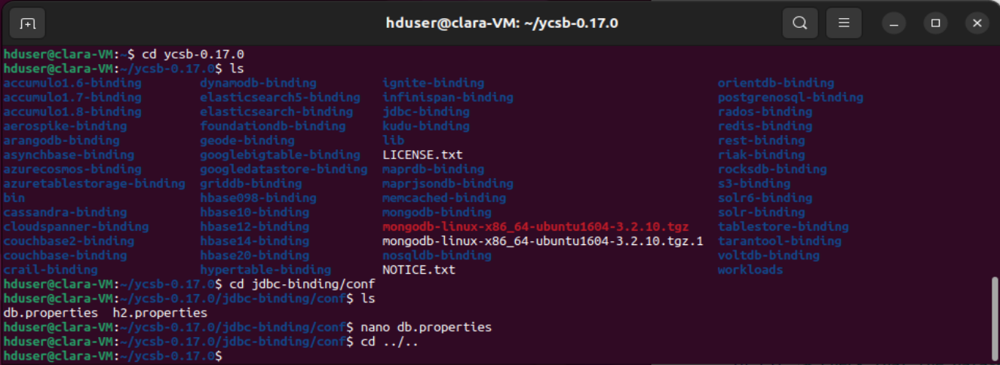

In [16]:
from IPython.display import Image
Image(filename=r'6. YCSB SQL pre nano db.properties.png')

Navigate to Directory: The commands navigate to the jdbc-binding/conf directory, which contains the configuration files for YCSB (Yahoo! Cloud Serving Benchmark).

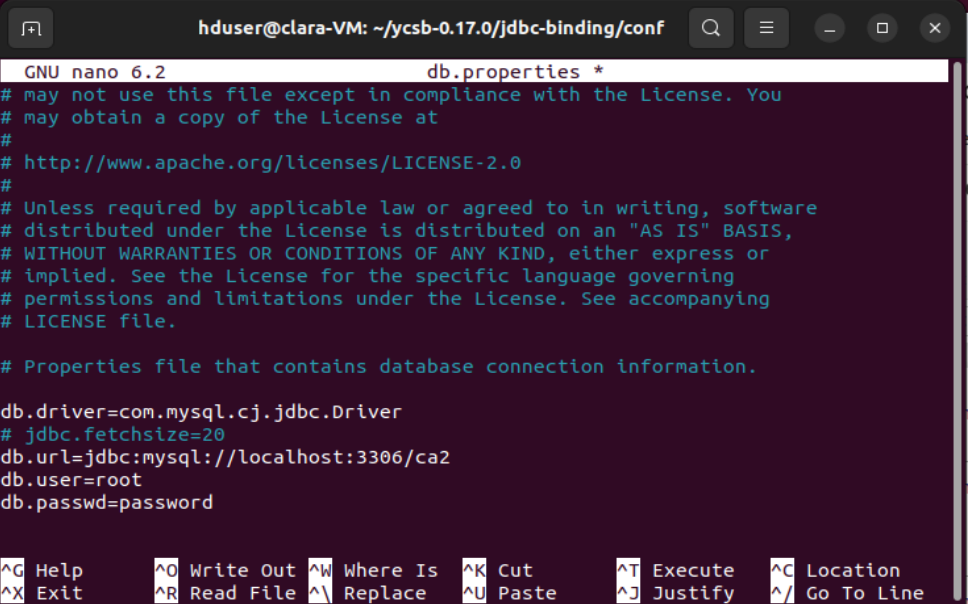

In [17]:
from IPython.display import Image
Image(filename=r'7. YCSB SQL nano db.properties.png')

Edit Configuration File: The nano db.properties command opens the db.properties file in the nano text editor.

Database Connection Settings: The file is configured with database connection information, including the JDBC driver, fetch size, database URL, and user credentials.

#### YCSB - SQL Workload a b c d e f 

Run YCSB Workload: The command bin/ycsb.sh load jdbc -P ./jdbc-binding/conf/db.properties -P workloads/workloada runs a YCSB workload against the MySQL database configured in db.properties.

We used workloada, workloadb, workloadc, workloadd, workloade, workloadf

Load Test Output: The output shows the progress and results of the load test, including throughput, latency, and other performance metrics.

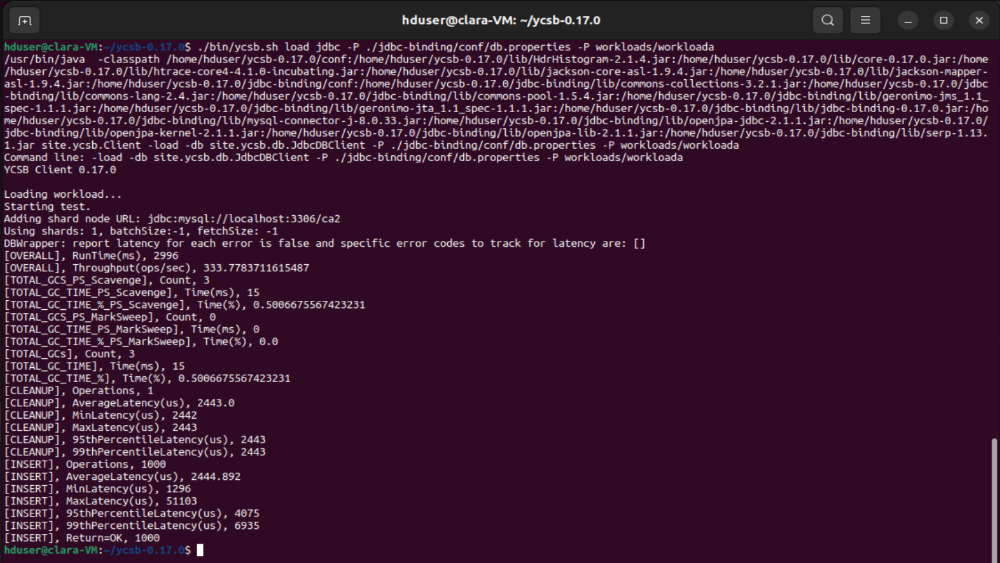

In [22]:
from IPython.display import Image
Image(filename=r'8. YCSB SQL workloada.png')

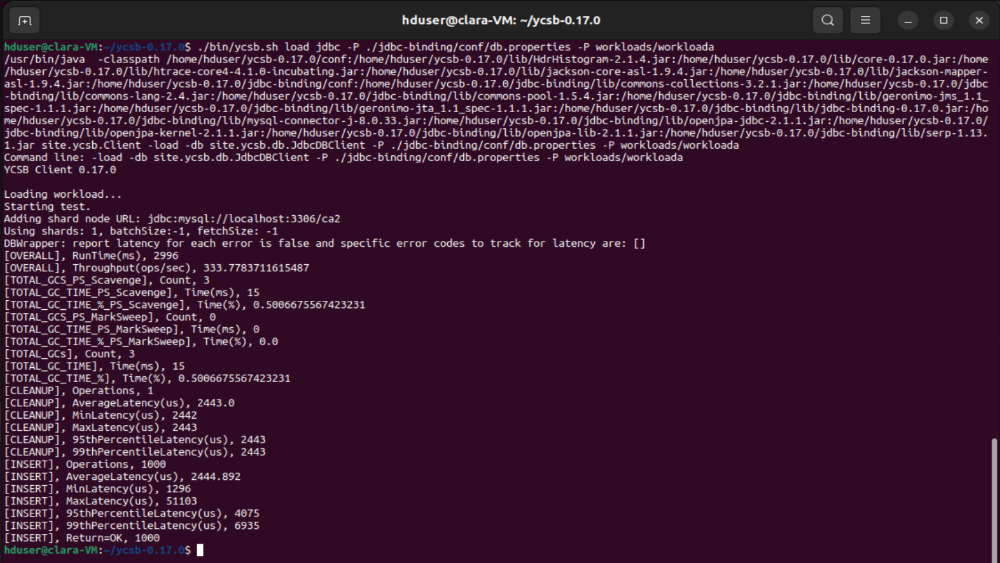

In [23]:
from IPython.display import Image
Image(filename=r'8. YCSB SQL workloada.png')

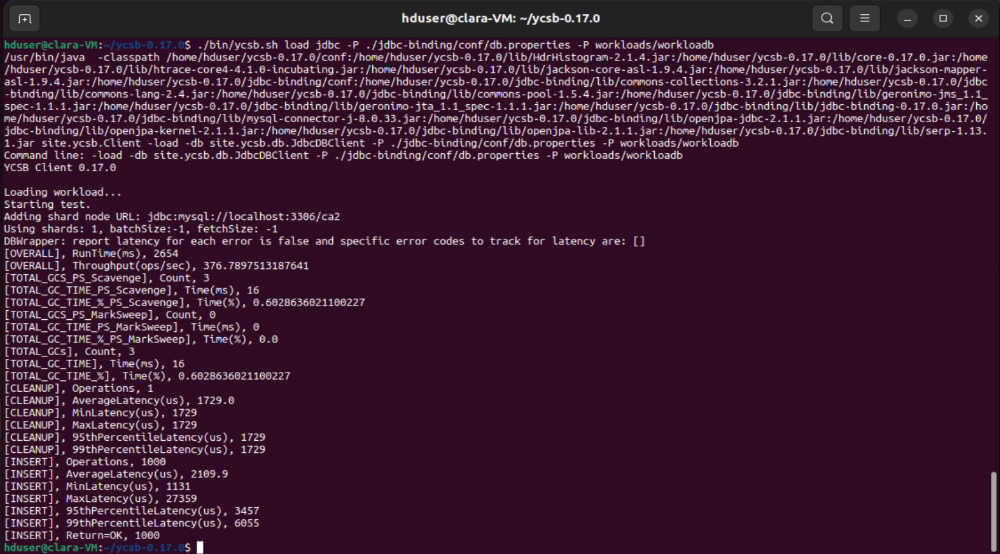

In [24]:
from IPython.display import Image
Image(filename=r'8. YCSB SQL workloadb.png')

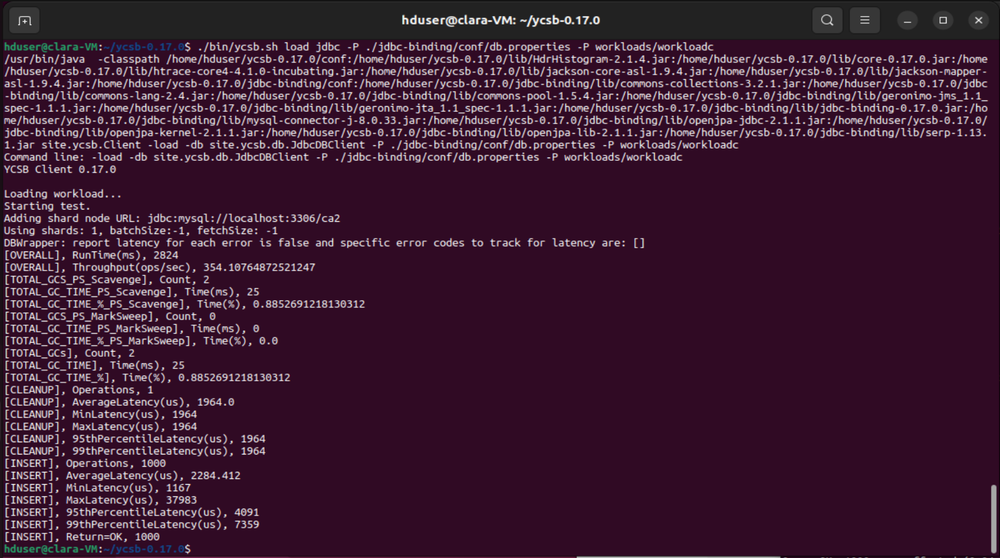

In [25]:
from IPython.display import Image
Image(filename=r'8. YCSB SQL workloadc.png')

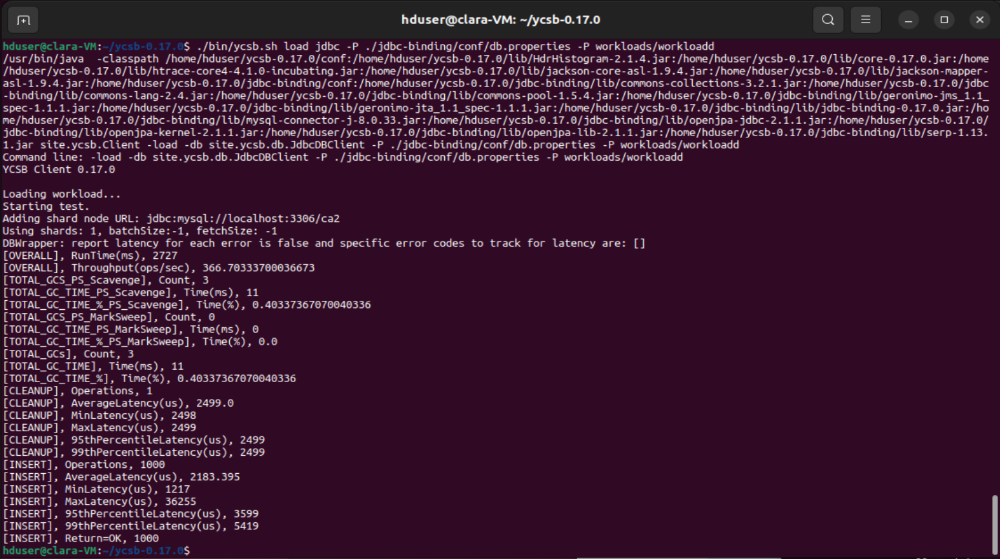

In [26]:
from IPython.display import Image
Image(filename=r'8. YCSB SQL workloadd.png')

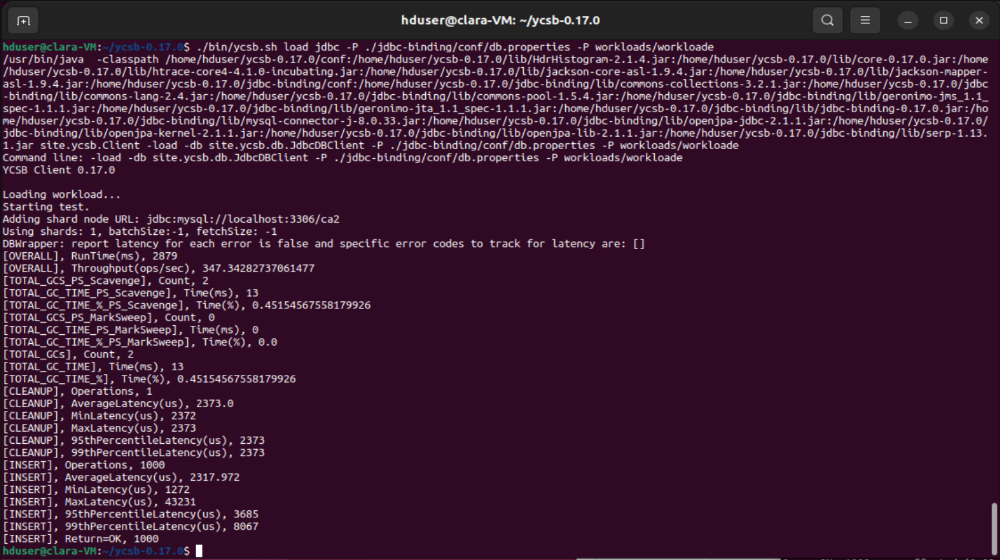

In [27]:
from IPython.display import Image
Image(filename=r'8. YCSB SQL workloade.png')

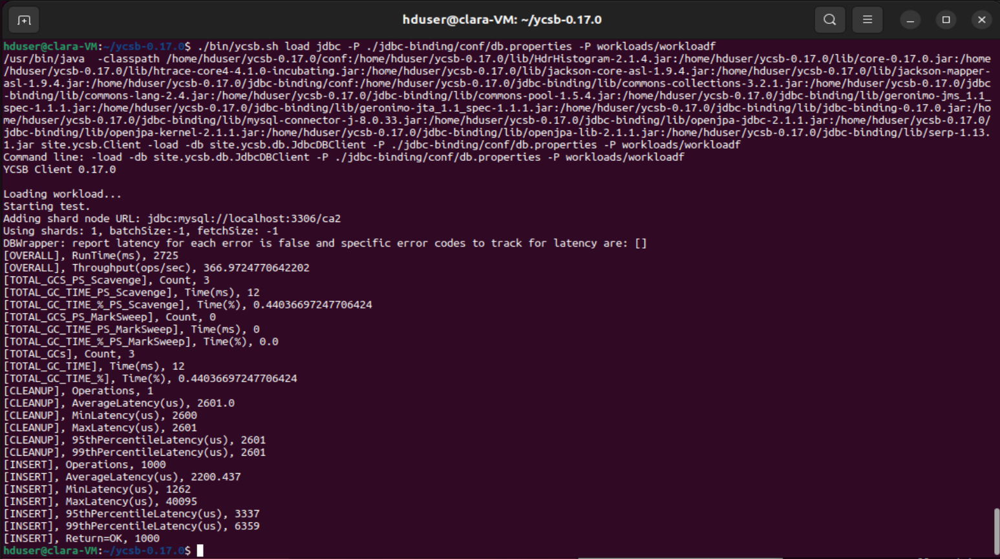

In [28]:
from IPython.display import Image
Image(filename=r'8. YCSB SQL workloadf.png')

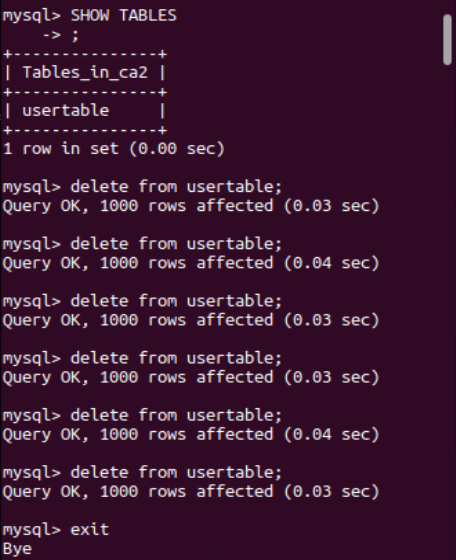

In [29]:
from IPython.display import Image
Image(filename=r'8.5 YCSB SQL - Check that usertable was filled all the time with 1000 rows.png')

#### YCSB - MongoDB Workload a b c d e f 

Run YCSB Workload: The command bin/ycsb.sh mongodb -P workloads/workloada runs a YCSB workload against the MySQL database configured in db.properties.

We used workloada, workloadb, workloadc, workloadd, workloade, workloadf

Load Test Output: The output shows the progress and results of the load test, including throughput, latency, and other performance metrics.

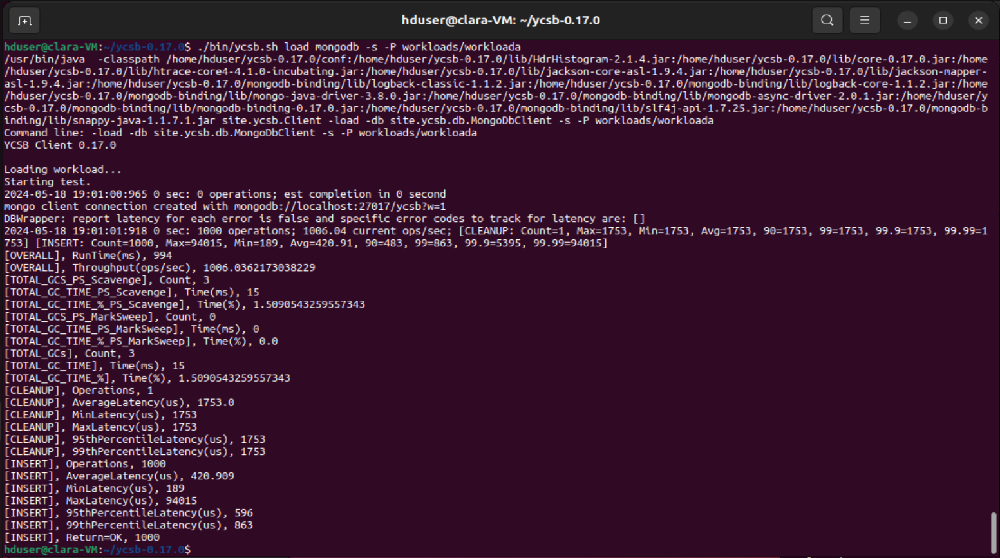

In [31]:
from IPython.display import Image
Image(filename=r'9. YCSB MongoDB workloada.png')

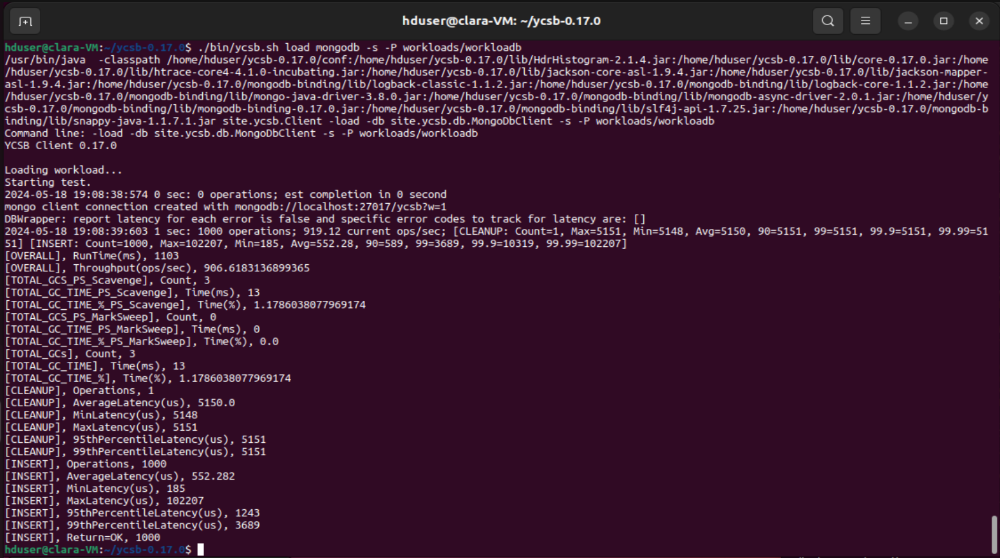

In [32]:
from IPython.display import Image
Image(filename=r'9. YCSB MongoDB workloadb.png')

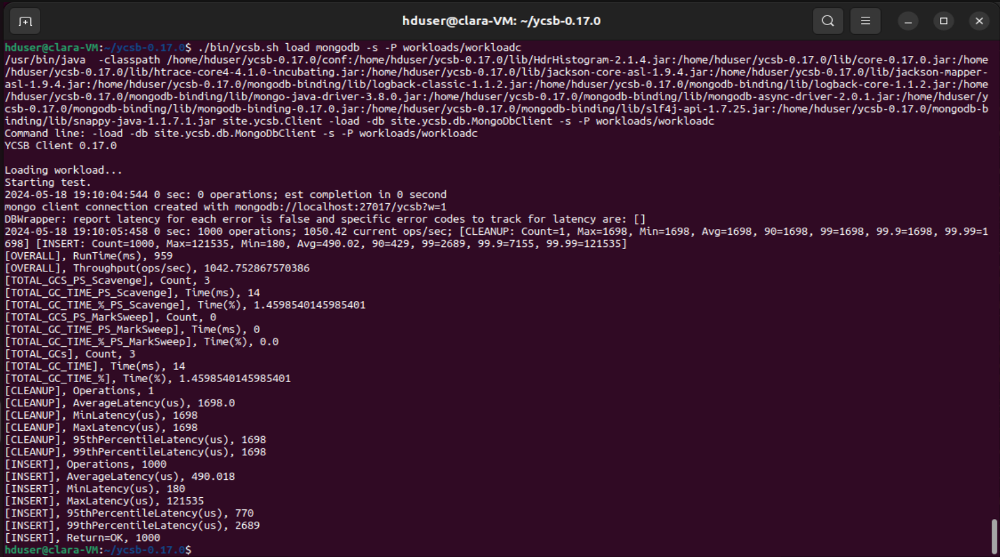

In [33]:
from IPython.display import Image
Image(filename=r'9. YCSB MongoDB workloadc.png')

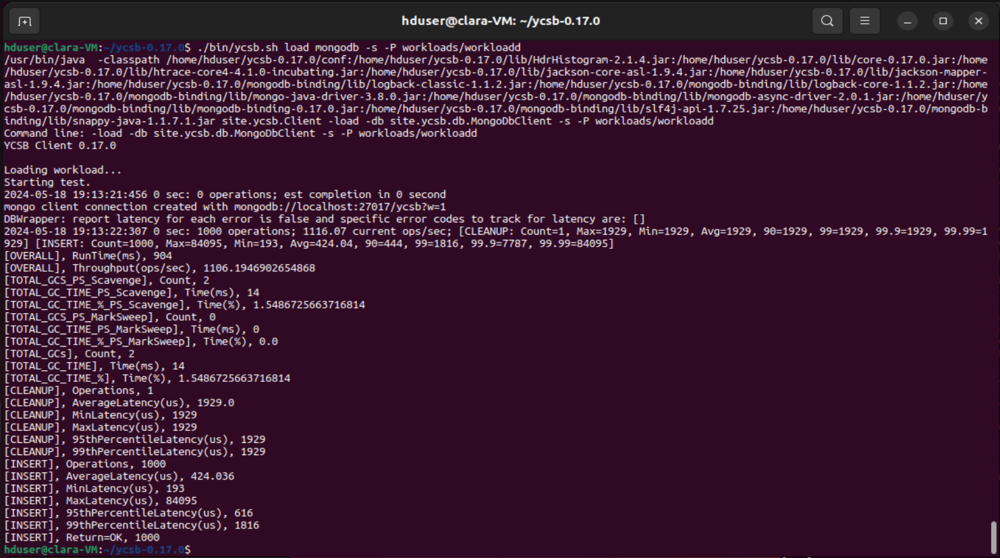

In [34]:
from IPython.display import Image
Image(filename=r'9. YCSB MongoDB workloadd.png')

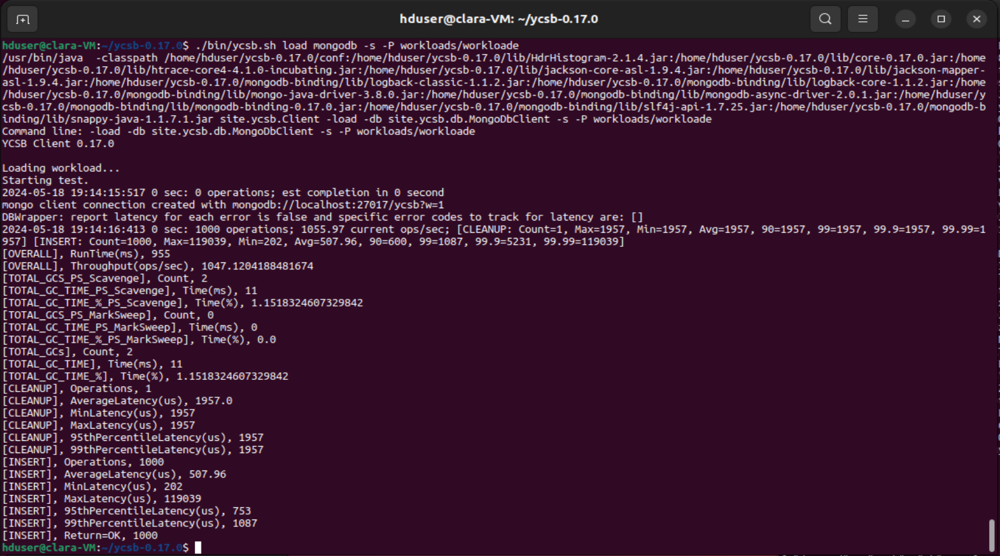

In [35]:
from IPython.display import Image
Image(filename=r'9. YCSB MongoDB workloade.png')

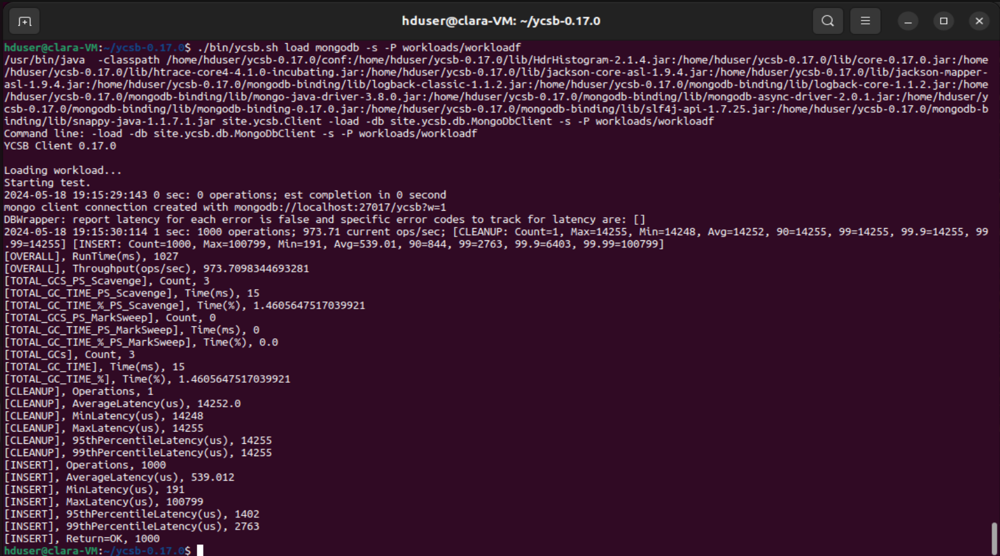

In [36]:
from IPython.display import Image
Image(filename=r'9. YCSB MongoDB workloadf.png')

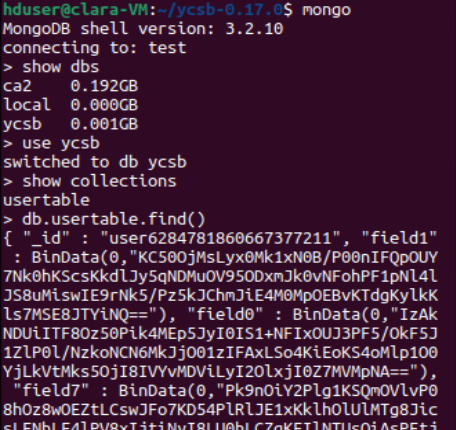

In [37]:
from IPython.display import Image
Image(filename=r'9.5 YCSB MongoDB database ycsb collection usertable successfully executed.png')

## SQL Queries

In [10]:
# Set Spark master to run locally
sc.master

'local[*]'

In [11]:
# Importing necessary modules from Spark
from pyspark.sql.types import *

In [12]:
# Initialize SparkContext
sc = spark.sparkContext

In [13]:
# Load the CSV file into a DataFrame
df_tweets = spark.read.load('/user1/tweets.csv', format="csv", header="true", sep=',')

# Display the first few rows of the DataFrame
df_tweets.head()

Row(id='0', unix_time='1467810369', date='2009-04-06 22:19:45', flag='NO_QUERY', user='_TheSpecialOne_', text="@switchfoot http://twitpic.com/2y1zl - Awww, that's a bummer.  You shoulda got David Carr of Third Day to do it. ;D")

In [14]:
# Creates a temporary view using the DataFrame
df_tweets.createOrReplaceTempView("tweets")

In [15]:
# Check for null values
spark.sql("""
    SELECT 
        SUM(CASE WHEN id IS NULL THEN 1 ELSE 0 END) AS id_nulls,
        SUM(CASE WHEN unix_time IS NULL THEN 1 ELSE 0 END) AS unix_time_nulls,
        SUM(CASE WHEN date IS NULL THEN 1 ELSE 0 END) AS date_nulls,
        SUM(CASE WHEN flag IS NULL THEN 1 ELSE 0 END) AS flag_nulls,
        SUM(CASE WHEN user IS NULL THEN 1 ELSE 0 END) AS user_nulls,
        SUM(CASE WHEN text IS NULL THEN 1 ELSE 0 END) AS text_nulls
    FROM tweets
""").show()

+--------+---------------+----------+----------+----------+----------+
|id_nulls|unix_time_nulls|date_nulls|flag_nulls|user_nulls|text_nulls|
+--------+---------------+----------+----------+----------+----------+
|       0|              0|         0|         0|         0|         0|
+--------+---------------+----------+----------+----------+----------+



In [16]:
# Check for duplicates
spark.sql("""
    SELECT 
        COUNT(*) AS total_rows,
        COUNT(DISTINCT id, unix_time, date, user, text) AS distinct_rows
    FROM tweets
""").show()

24/05/19 11:39:49 WARN RowBasedKeyValueBatch: Calling spill() on RowBasedKeyValueBatch. Will not spill but return 0.
24/05/19 11:39:49 WARN RowBasedKeyValueBatch: Calling spill() on RowBasedKeyValueBatch. Will not spill but return 0.
24/05/19 11:39:49 WARN RowBasedKeyValueBatch: Calling spill() on RowBasedKeyValueBatch. Will not spill but return 0.
24/05/19 11:39:49 WARN RowBasedKeyValueBatch: Calling spill() on RowBasedKeyValueBatch. Will not spill but return 0.


+----------+-------------+
|total_rows|distinct_rows|
+----------+-------------+
|   1600000|      1600000|
+----------+-------------+



In [17]:
# View the schema
spark.sql("DESCRIBE tweets").show()

+---------+---------+-------+
| col_name|data_type|comment|
+---------+---------+-------+
|       id|   string|   null|
|unix_time|   string|   null|
|     date|   string|   null|
|     flag|   string|   null|
|     user|   string|   null|
|     text|   string|   null|
+---------+---------+-------+



Check and Cast Columns to Appropriate Data Types
- id: Should be INT.
- unix_time: Should be BIGINT.
- date: Should be TIMESTAMP.
- flag: Can remain as STRING.
- user: Should be STRING.
- text: Should be STRING.

In [18]:
# Cast columns to appropriate data types
df_with_cast = spark.sql("""
    SELECT 
        CAST(id AS INT) AS id,
        CAST(unix_time AS BIGINT) AS unix_time,
        CAST(date AS TIMESTAMP) AS date,
        CAST(flag AS STRING) AS flag,
        CAST(user AS STRING) AS user,
        CAST(text AS STRING) AS text
    FROM tweets
""")

# Create a new temporary view with the updated schema
df_with_cast.createOrReplaceTempView("tweets_cast")

# Show the final cleaned data
spark.sql("SELECT * FROM tweets_cast LIMIT 5").show()

+---+----------+-------------------+--------+---------------+--------------------+
| id| unix_time|               date|    flag|           user|                text|
+---+----------+-------------------+--------+---------------+--------------------+
|  0|1467810369|2009-04-06 22:19:45|NO_QUERY|_TheSpecialOne_|@switchfoot http:...|
|  1|1467810672|2009-04-06 22:19:49|NO_QUERY|  scotthamilton|is upset that he ...|
|  2|1467810917|2009-04-06 22:19:53|NO_QUERY|       mattycus|@Kenichan I dived...|
|  3|1467811184|2009-04-06 22:19:57|NO_QUERY|        ElleCTF|my whole body fee...|
|  4|1467811193|2009-04-06 22:19:57|NO_QUERY|         Karoli|@nationwideclass ...|
+---+----------+-------------------+--------+---------------+--------------------+



In [19]:
# View the schema
spark.sql("DESCRIBE tweets_cast").show()

+---------+---------+-------+
| col_name|data_type|comment|
+---------+---------+-------+
|       id|      int|   null|
|unix_time|   bigint|   null|
|     date|timestamp|   null|
|     flag|   string|   null|
|     user|   string|   null|
|     text|   string|   null|
+---------+---------+-------+



Queries

In [20]:
# Count the number of records
spark.sql("SELECT COUNT(*) AS total_records FROM tweets_cast").show()


+-------------+
|total_records|
+-------------+
|      1600000|
+-------------+



In [21]:
# Count the number of unique users
spark.sql("SELECT COUNT(DISTINCT user) AS unique_users FROM tweets_cast").show()

+------------+
|unique_users|
+------------+
|      659775|
+------------+



In [22]:
# Top 10 most active users
spark.sql("""
    SELECT user, COUNT(*) AS tweet_count
    FROM tweets_cast
    GROUP BY user
    ORDER BY tweet_count DESC
    LIMIT 10
""").show()


+---------------+-----------+
|           user|tweet_count|
+---------------+-----------+
|       lost_dog|        549|
|        webwoke|        345|
|       tweetpet|        310|
|SallytheShizzle|        281|
|    VioletsCRUK|        279|
|    mcraddictal|        276|
|       tsarnick|        248|
|    what_bugs_u|        246|
|    Karen230683|        238|
|      DarkPiano|        236|
+---------------+-----------+



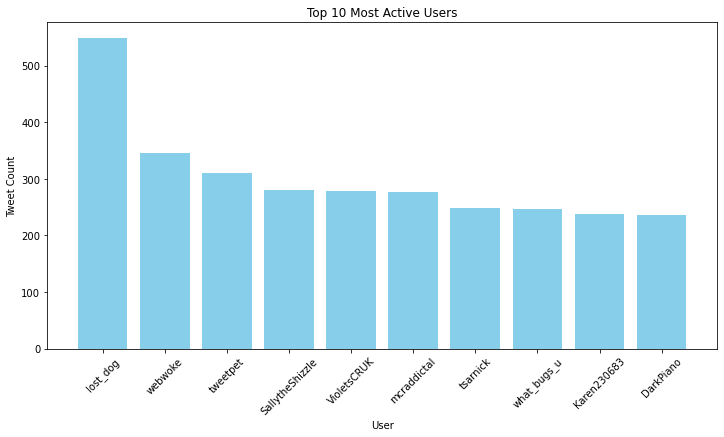

In [23]:
# Top 10 most active users
# Execute the query and convert the result to a Pandas DataFrame
df_top10_users = spark.sql("""
    SELECT user, COUNT(*) AS tweet_count
    FROM tweets_cast
    GROUP BY user
    ORDER BY tweet_count DESC
    LIMIT 10
""").toPandas()

# Plot the top 10 most active users
plt.figure(figsize=(12, 6))
plt.bar(df_top10_users['user'], df_top10_users['tweet_count'], color='skyblue')
plt.xlabel('User')
plt.ylabel('Tweet Count')
plt.title('Top 10 Most Active Users')
plt.xticks(rotation=45)
plt.show()


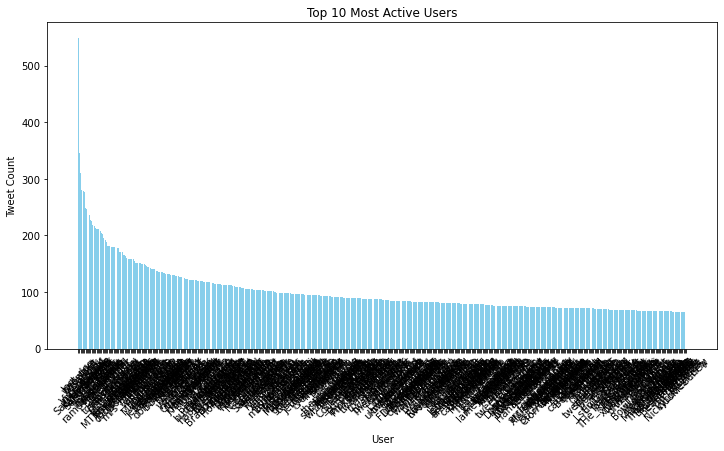

In [24]:
# Top 500 most active users
# Execute the query and convert the result to a Pandas DataFrame
df_top_users = spark.sql("""
    SELECT user, COUNT(*) AS tweet_count
    FROM tweets_cast
    GROUP BY user
    ORDER BY tweet_count DESC
    LIMIT 500
""").toPandas()

# Plot the top 10 most active users
plt.figure(figsize=(12, 6))
plt.bar(df_top_users['user'], df_top_users['tweet_count'], color='skyblue')
plt.xlabel('User')
plt.ylabel('Tweet Count')
plt.title('Top 10 Most Active Users')
plt.xticks(rotation=45)
plt.show()

In [25]:
# Distribution of tweets over time
# Extract month and aggregate tweet counts by month
spark.sql("""
    SELECT DATE(date) AS tweet_date, COUNT(*) AS tweet_count
    FROM tweets_cast
    GROUP BY tweet_date
    ORDER BY tweet_date
""").show()

+----------+-----------+
|tweet_date|tweet_count|
+----------+-----------+
|2009-04-06|       3360|
|2009-04-07|      17311|
|2009-04-17|       3084|
|2009-04-18|      21754|
|2009-04-19|      27469|
|2009-04-20|      18460|
|2009-04-21|       8587|
|2009-05-01|       7716|
|2009-05-02|      27434|
|2009-05-03|      35333|
|2009-05-04|      15481|
|2009-05-09|      11739|
|2009-05-10|      26029|
|2009-05-11|       4186|
|2009-05-13|       4066|
|2009-05-14|      17460|
|2009-05-16|       9146|
|2009-05-17|      40154|
|2009-05-18|      36469|
|2009-05-21|       2132|
+----------+-----------+
only showing top 20 rows



In [26]:
# Distribution of tweets over time
# Execute the query to get tweet counts by date
df_tweets_per_date = spark.sql("""
    SELECT DATE(date) AS tweet_date, COUNT(*) AS tweet_count
    FROM tweets_cast
    GROUP BY tweet_date
    ORDER BY tweet_date
""").toPandas()

In [27]:
# Check the structure of the DataFrame
print(df_tweets_per_date.head())
print(df_tweets_per_date.dtypes)

   tweet_date  tweet_count
0  2009-04-06         3360
1  2009-04-07        17311
2  2009-04-17         3084
3  2009-04-18        21754
4  2009-04-19        27469
tweet_date     object
tweet_count     int64
dtype: object


In [28]:
# Ensure the tweet_date column is in datetime format
df_tweets_per_date['tweet_date'] = pd.to_datetime(df_tweets_per_date['tweet_date'])

# Ensure the tweet_count column is in int format
df_tweets_per_date['tweet_count'] = df_tweets_per_date['tweet_count'].astype(int)

# Convert columns to numpy arrays for plotting
tweet_dates = df_tweets_per_date['tweet_date'].values
tweet_counts = df_tweets_per_date['tweet_count'].values

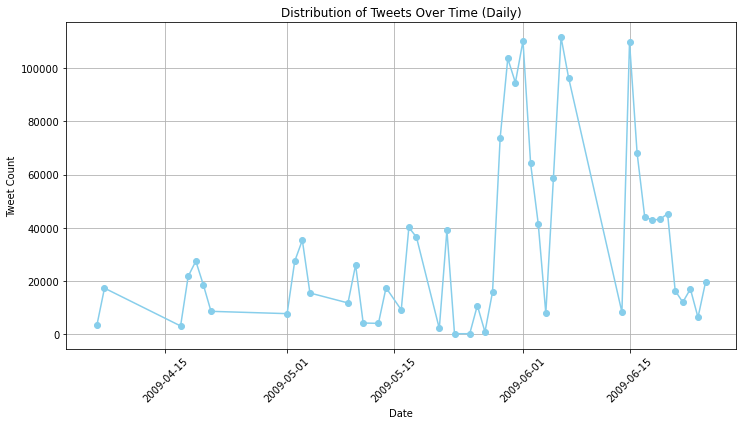

,tweet_date,tweet_count
0,2009-04-06,3360
1,2009-04-07,17311
2,2009-04-17,3084
3,2009-04-18,21754
4,2009-04-19,27469
5,2009-04-20,18460
6,2009-04-21,8587
7,2009-05-01,7716
8,2009-05-02,27434
9,2009-05-03,35333


In [29]:
# Plot the distribution of tweets over time by date
plt.figure(figsize=(12, 6))
plt.plot(tweet_dates, tweet_counts, color='skyblue', marker='o')
plt.xlabel('Date')
plt.ylabel('Tweet Count')
plt.title('Distribution of Tweets Over Time (Daily)')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

df_with_cast
df_top10_users
df_top_users
df_tweets_per_date

In [30]:
# Average length of tweets
spark.sql("SELECT AVG(LENGTH(text)) AS avg_tweet_length FROM tweets_cast").show()


+----------------+
|avg_tweet_length|
+----------------+
|    74.090110625|
+----------------+



In [31]:
# Top 10 most common words in tweets
spark.sql("""
    SELECT word, COUNT(*) AS word_count
    FROM (
        SELECT EXPLODE(SPLIT(text, ' ')) AS word
        FROM tweets_cast
    ) subquery
    GROUP BY word
    ORDER BY word_count DESC
    LIMIT 10
""").show()


+----+----------+
|word|word_count|
+----+----------+
|    |   1930617|
|  to|    552962|
|   I|    496608|
| the|    487500|
|   a|    366212|
|  my|    280025|
| and|    275263|
|   i|    249975|
|  is|    217692|
| you|    213871|
+----+----------+



In [32]:
# Tweets per user distribution
spark.sql("""
    SELECT tweet_count, COUNT(*) AS user_count
    FROM (
        SELECT user, COUNT(*) AS tweet_count
        FROM tweets_cast
        GROUP BY user
    ) subquery
    GROUP BY tweet_count
    ORDER BY tweet_count
""").show()


+-----------+----------+
|tweet_count|user_count|
+-----------+----------+
|          1|    405277|
|          2|    111277|
|          3|     49314|
|          4|     26819|
|          5|     16515|
|          6|     11216|
|          7|      7725|
|          8|      5485|
|          9|      4272|
|         10|      3277|
|         11|      2549|
|         12|      2047|
|         13|      1764|
|         14|      1486|
|         15|      1179|
|         16|      1018|
|         17|       882|
|         18|       733|
|         19|       695|
|         20|       520|
+-----------+----------+
only showing top 20 rows



In [33]:
# Earliest and latest tweet dates
spark.sql("SELECT MIN(date) AS earliest_tweet, MAX(date) AS latest_tweet FROM tweets_cast").show()


+-------------------+-------------------+
|     earliest_tweet|       latest_tweet|
+-------------------+-------------------+
|2009-04-06 22:19:45|2009-06-25 10:28:31|
+-------------------+-------------------+



In [34]:
# Distribution of tweet lengths
spark.sql("""
    SELECT LENGTH(text) AS tweet_length, COUNT(*) AS tweet_count
    FROM tweets_cast
    GROUP BY tweet_length
    ORDER BY tweet_length
""").show()


+------------+-----------+
|tweet_length|tweet_count|
+------------+-----------+
|           6|          6|
|           7|         77|
|           8|       1182|
|           9|       1870|
|          10|       1863|
|          11|       2515|
|          12|       3120|
|          13|       4502|
|          14|       5032|
|          15|       5688|
|          16|       6376|
|          17|       7418|
|          18|       8010|
|          19|       8764|
|          20|       9573|
|          21|      10417|
|          22|      11079|
|          23|      11532|
|          24|      12001|
|          25|      12633|
+------------+-----------+
only showing top 20 rows



The tweet_length column represents the number of characters in each tweet, and the tweet_count column represents how many tweets have that specific length.

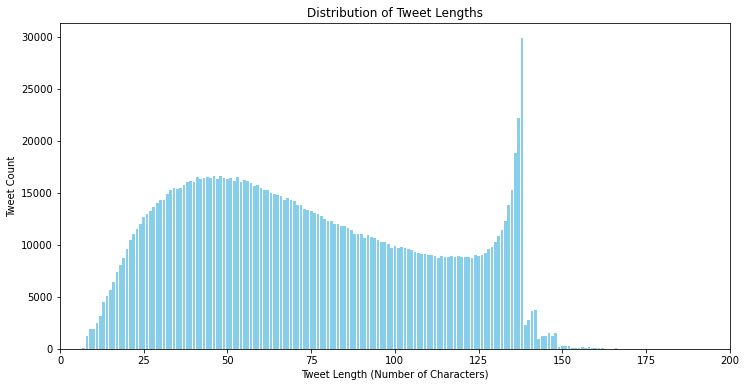

In [35]:
# Distribution of tweet lengths
# Convert the Spark DataFrame to a Pandas DataFrame
df_tweet_length = spark.sql("""
    SELECT LENGTH(text) AS tweet_length, COUNT(*) AS tweet_count
    FROM tweets_cast
    GROUP BY tweet_length
    ORDER BY tweet_length
""").toPandas()

# Plot the distribution of tweet lengths
plt.figure(figsize=(12, 6))
plt.bar(df_tweet_length['tweet_length'], df_tweet_length['tweet_count'], color='skyblue')
plt.xlabel('Tweet Length (Number of Characters)')
plt.ylabel('Tweet Count')
plt.title('Distribution of Tweet Lengths')
plt.xlim(0, 200) 
plt.show()

# Limit the x-axis to 200, because in 2009 the maximum characters you could write was 140

In [40]:
# Export the DataFrames to a CSV files
df_tweet_length.to_csv('/home/hduser/ca2.semester2.msc/tweet_lengths.csv', index=False)
df_tweets_per_date.to_csv('/home/hduser/ca2.semester2.msc/tweets_per_date.csv', index=False)
df_top10_users.to_csv('/home/hduser/ca2.semester2.msc/top10_users.csv', index=False)
df_top_users.to_csv('/home/hduser/ca2.semester2.msc/top_users.csv', index=False)
# df_with_cast.to_csv('/home/hduser/ca2.semester2.msc/df_with_cast.csv', index=False)

I wanted to download df_with_cast so that I could perform the advanced data analytics part outside the VM. However, I am encountering errors with the date format, as you can see below:

In [39]:

# Convert the Spark DataFrame to a Pandas DataFrame
df_with_cast_pandas = df_with_cast.toPandas()

# Ensure the 'date' column is in datetime64[ns] format
df_with_cast_pandas['date'] = pd.to_datetime(df_with_cast_pandas['date'])

TypeError: Casting to unit-less dtype 'datetime64' is not supported. Pass e.g. 'datetime64[ns]' instead.